Importing Libraries

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import  accuracy_score,classification_report,ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

Loading Datasets

In [9]:
df1 = pd.read_csv("C:\\Users\\Nilanjan\\Desktop\\AICTE Internship\\modis_2021_India.csv")
df2 = pd.read_csv("C:\\Users\\Nilanjan\\Desktop\\AICTE Internship\\modis_2022_India.csv")
df3 = pd.read_csv("C:\\Users\\Nilanjan\\Desktop\\AICTE Internship\\modis_2023_India.csv")

Viewing Datasets

In [10]:
#printning first and last 5 rows
df1.head() 


,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,01-01-2021,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,01-01-2021,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,01-01-2021,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,01-01-2021,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,01-01-2021,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [11]:
df1.tail()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
111262,21.1066,72.6336,307.9,1.5,1.2,31-12-2021,1703,Terra,MODIS,73,6.03,290.5,16.1,N,2
111263,19.1224,76.7451,303.2,1.0,1.0,31-12-2021,1703,Terra,MODIS,54,6.03,288.0,6.5,N,0
111264,19.2367,76.9620,304.1,1.0,1.0,31-12-2021,1703,Terra,MODIS,59,6.03,288.2,7.2,N,0
111265,23.7817,86.3960,306.2,1.2,1.1,31-12-2021,1954,Aqua,MODIS,65,6.03,287.8,10.8,N,2
111266,20.7973,85.2590,302.6,1.2,1.1,31-12-2021,1955,Aqua,MODIS,50,6.03,289.1,8.4,N,2


In [12]:
df2.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,30.1138,80.0756,300.0,1.2,1.1,2022-01-01,511,Terra,MODIS,7,6.03,288.4,7.1,D,0
1,23.7726,86.2078,306.1,1.6,1.2,2022-01-01,512,Terra,MODIS,62,6.03,293.5,10.4,D,2
2,22.2080,84.8627,304.8,1.4,1.2,2022-01-01,512,Terra,MODIS,42,6.03,293.3,5.8,D,2
3,23.7621,86.3946,306.9,1.6,1.2,2022-01-01,512,Terra,MODIS,38,6.03,295.2,9.3,D,2
4,23.6787,86.0891,303.6,1.5,1.2,2022-01-01,512,Terra,MODIS,52,6.03,293.1,7.2,D,2


In [13]:
df2.tail()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
81520,29.9033,74.9521,303.3,2.7,1.6,2022-12-31,1726,Terra,MODIS,55,6.03,281.3,37.2,N,0
81521,29.9086,74.9460,323.9,2.7,1.6,2022-12-31,1726,Terra,MODIS,100,6.03,282.0,106.5,N,0
81522,29.9170,74.9576,323.5,1.9,1.3,2022-12-31,2127,Aqua,MODIS,100,6.03,274.6,66.9,N,0
81523,21.1048,72.6415,302.9,2.0,1.4,2022-12-31,2130,Aqua,MODIS,52,6.03,289.9,18.5,N,2
81524,21.1137,72.6380,302.7,2.0,1.4,2022-12-31,2130,Aqua,MODIS,51,6.03,290.1,18.3,N,2


In [14]:
df3.tail()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
78420,17.1067,74.4049,304.0,2.3,1.5,2023-12-31,1715,Terra,MODIS,58,61.03,289.2,23.2,N,0
78421,16.3284,75.2590,304.2,2.6,1.5,2023-12-31,1715,Terra,MODIS,59,61.03,288.9,29.5,N,0
78422,21.1095,72.6422,306.5,1.9,1.3,2023-12-31,1716,Terra,MODIS,68,61.03,294.2,18.2,N,2
78423,21.0664,72.8734,310.0,1.0,1.0,2023-12-31,2125,Aqua,MODIS,79,61.03,292.7,10.2,N,2
78424,21.0679,72.8637,316.9,1.0,1.0,2023-12-31,2125,Aqua,MODIS,94,61.03,293.1,16.0,N,2


In [15]:
df3.tail()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
78420,17.1067,74.4049,304.0,2.3,1.5,2023-12-31,1715,Terra,MODIS,58,61.03,289.2,23.2,N,0
78421,16.3284,75.2590,304.2,2.6,1.5,2023-12-31,1715,Terra,MODIS,59,61.03,288.9,29.5,N,0
78422,21.1095,72.6422,306.5,1.9,1.3,2023-12-31,1716,Terra,MODIS,68,61.03,294.2,18.2,N,2
78423,21.0664,72.8734,310.0,1.0,1.0,2023-12-31,2125,Aqua,MODIS,79,61.03,292.7,10.2,N,2
78424,21.0679,72.8637,316.9,1.0,1.0,2023-12-31,2125,Aqua,MODIS,94,61.03,293.1,16.0,N,2


In [16]:
#concatinating:
df = pd.concat([df1, df2, df3], ignore_index=True)
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type
0,28.0993,96.9983,303.0,1.1,1.1,01-01-2021,409,Terra,MODIS,44,6.03,292.6,8.6,D,0
1,30.0420,79.6492,301.8,1.4,1.2,01-01-2021,547,Terra,MODIS,37,6.03,287.4,9.0,D,0
2,30.0879,78.8579,300.2,1.3,1.1,01-01-2021,547,Terra,MODIS,8,6.03,286.5,5.4,D,0
3,30.0408,80.0501,302.0,1.5,1.2,01-01-2021,547,Terra,MODIS,46,6.03,287.7,10.7,D,0
4,30.6565,78.9668,300.9,1.3,1.1,01-01-2021,547,Terra,MODIS,43,6.03,287.6,9.0,D,0


In [17]:
#checking the no. of rows and columns
df.shape

(271217, 15)

In [18]:
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271217 entries, 0 to 271216
Data columns (total 15 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   latitude    271217 non-null  float64
 1   longitude   271217 non-null  float64
 2   brightness  271217 non-null  float64
 3   scan        271217 non-null  float64
 4   track       271217 non-null  float64
 5   acq_date    271217 non-null  object 
 6   acq_time    271217 non-null  int64  
 7   satellite   271217 non-null  object 
 8   instrument  271217 non-null  object 
 9   confidence  271217 non-null  int64  
 10  version     271217 non-null  float64
 11  bright_t31  271217 non-null  float64
 12  frp         271217 non-null  float64
 13  daynight    271217 non-null  object 
 14  type        271217 non-null  int64  
dtypes: float64(8), int64(3), object(4)
memory usage: 31.0+ MB


In [19]:
#Checking for missing Values

df.isnull().sum()


latitude      0
longitude     0
brightness    0
scan          0
track         0
acq_date      0
acq_time      0
satellite     0
instrument    0
confidence    0
version       0
bright_t31    0
frp           0
daynight      0
type          0
dtype: int64

In [20]:
#checking for duplicate values:
df.duplicated().sum()


0

In [21]:
#Checking the list of columns

df.columns

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_date',
       'acq_time', 'satellite', 'instrument', 'confidence', 'version',
       'bright_t31', 'frp', 'daynight', 'type'],
      dtype='object')

In [22]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,271217.0,23.947505,4.919846,8.1362,20.9655,23.7888,27.7827,34.9734
longitude,271217.0,81.284024,6.559071,68.4526,75.8802,79.3209,84.7559,97.1044
brightness,271217.0,323.719192,14.147221,300.0000,314.5000,322.0000,330.7000,505.7000
scan,271217.0,1.421732,0.630742,1.0000,1.0000,1.2000,1.5000,4.8000
track,271217.0,1.152716,0.201943,1.0000,1.0000,1.1000,1.2000,2.0000
acq_time,271217.0,824.623755,353.966965,321.0000,648.0000,756.0000,825.0000,2202.0000
confidence,271217.0,64.065081,18.165329,0.0000,54.0000,66.0000,76.0000,100.0000
version,271217.0,21.933778,24.935515,6.0300,6.0300,6.0300,61.0300,61.0300
bright_t31,271217.0,303.499177,8.282440,267.2000,298.2000,302.5000,309.2000,400.1000
frp,271217.0,27.722058,81.017471,0.0000,8.7000,13.5000,24.5000,6961.8000


In [23]:
#Checking for unique values:

df.type.value_counts()

type
0    257625
2     13550
3        42
Name: count, dtype: int64

Exploratory Data Analysis(EDA Analysis)

In [24]:
for col in df.columns:
  if df[col].dtype == 'object':
    print(f"Column: {col}")
    print(f"Unique values: {df[col].unique()}")
    print(f"Number of unique values: {df[col].nunique()}")
    print("-" * 50)

Column: acq_date
Unique values: ['01-01-2021' '02-01-2021' '03-01-2021' ... '2023-12-29' '2023-12-30'
 '2023-12-31']
Number of unique values: 1088
--------------------------------------------------
Column: satellite
Unique values: ['Terra' 'Aqua']
Number of unique values: 2
--------------------------------------------------
Column: instrument
Unique values: ['MODIS']
Number of unique values: 1
--------------------------------------------------
Column: daynight
Unique values: ['D' 'N']
Number of unique values: 2
--------------------------------------------------


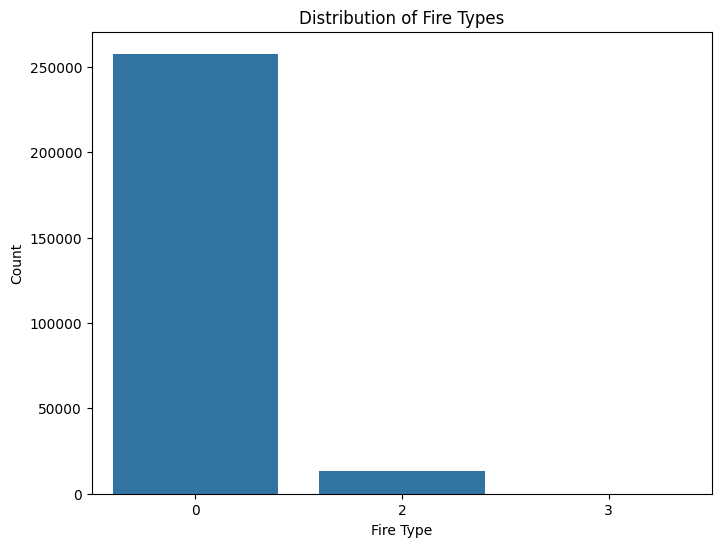

1. The count plot shows the distribution of different fire types in the dataset.
2. It is evident that 'MODIS' is the most frequent fire type, followed by 'VIIRS'.
3. The 'type' variable appears to be unbalanced, with 'MODIS' having significantly more observations than 'VIIRS'. This imbalance might need to be considered during model training.


In [25]:
#Count plot
plt.figure(figsize=(8, 6))
sns.countplot(x='type', data=df)
plt.title('Distribution of Fire Types')
plt.xlabel('Fire Type')
plt.ylabel('Count')
plt.show()

print("1. The count plot shows the distribution of different fire types in the dataset.\n"
"2. It is evident that 'MODIS' is the most frequent fire type, followed by 'VIIRS'.\n"
"3. The 'type' variable appears to be unbalanced, with 'MODIS' having significantly more observations than 'VIIRS'. This imbalance might need to be considered during model training.")

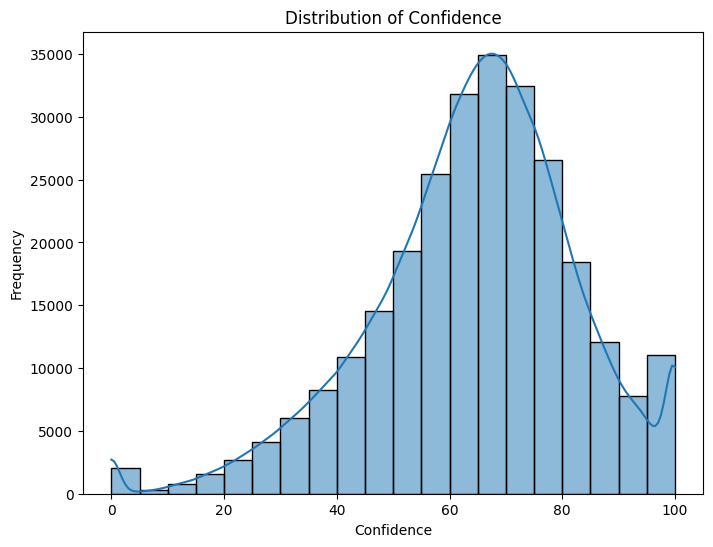

1. The histogram illustrates the distribution of the 'confidence' feature.
2. The distribution appears to be bimodal, with peaks around low confidence values and high confidence values.
3. There are fewer observations in the middle range of confidence.
4. This suggests that observations are often recorded with either low confidence or high confidence.



In [26]:
# Histogram of 'confidence'
plt.figure(figsize=(8, 6))
sns.histplot(df['confidence'], bins=20, kde=True)
plt.title('Distribution of Confidence')
plt.xlabel('Confidence')
plt.ylabel('Frequency')
plt.show()

print("1. The histogram illustrates the distribution of the 'confidence' feature.\n"
"2. The distribution appears to be bimodal, with peaks around low confidence values and high confidence values.\n"
"3. There are fewer observations in the middle range of confidence.\n"
"4. This suggests that observations are often recorded with either low confidence or high confidence.\n")



WEEK 2



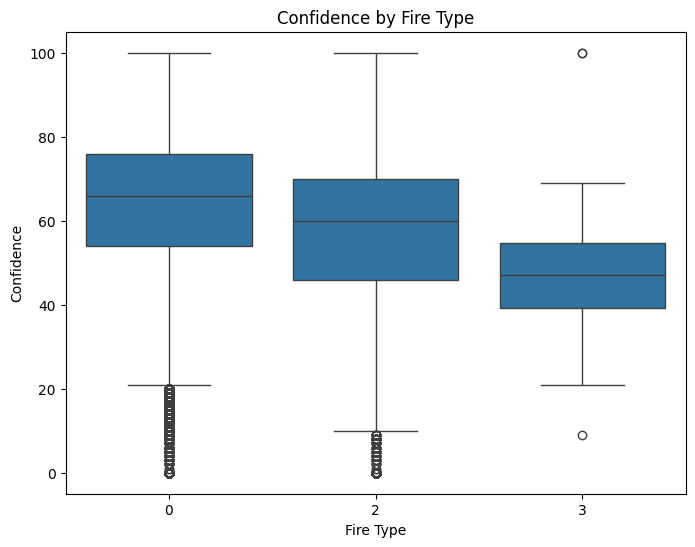

In [27]:
# Box plot for 'confidence' by 'type'
plt.figure(figsize=(8, 6))
sns.boxplot(x='type', y='confidence', data=df)
plt.title('Confidence by Fire Type')
plt.xlabel('Fire Type')
plt.ylabel('Confidence')
plt.show()

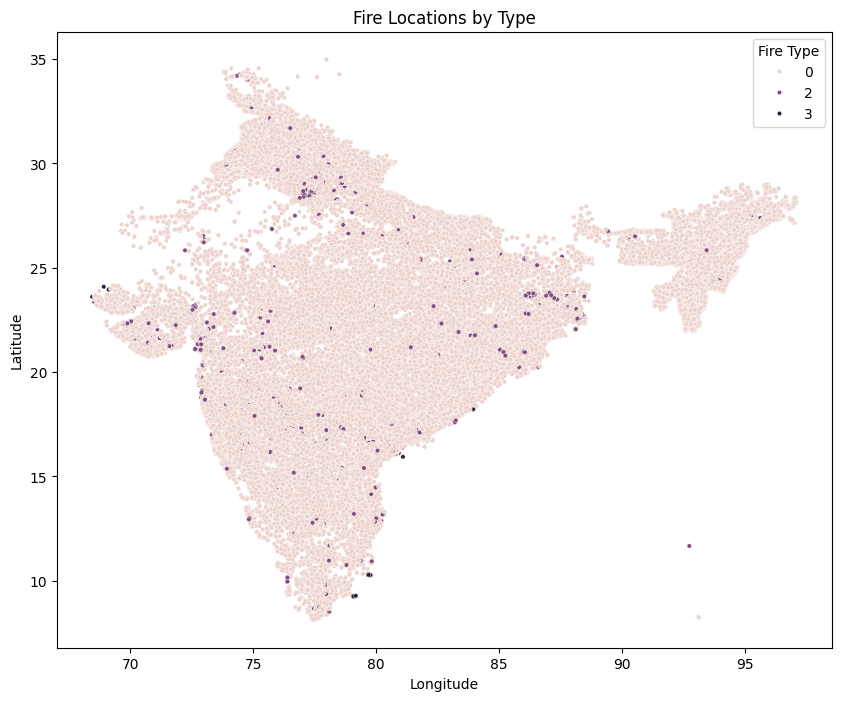

In [28]:
# Scatter plot of 'latitude' vs 'longitude'
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=df, hue='type', s=10)
plt.title('Fire Locations by Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Fire Type')
plt.show()

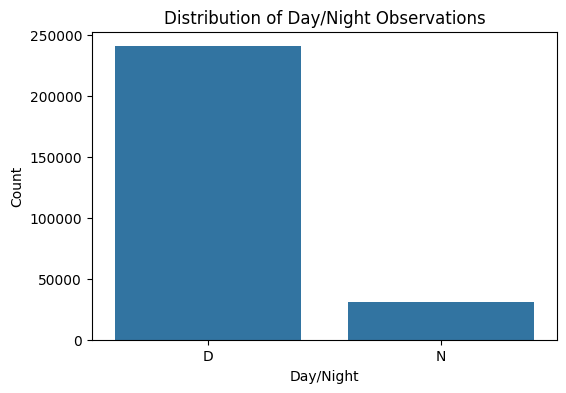

In [29]:
# Count plot for 'daynight'
plt.figure(figsize=(6, 4))
sns.countplot(x='daynight', data=df)
plt.title('Distribution of Day/Night Observations')
plt.xlabel('Day/Night')
plt.ylabel('Count')
plt.show()

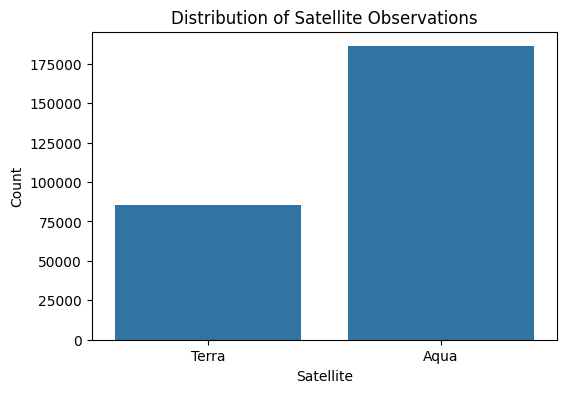

In [30]:
# Count plot for 'Satellite'
plt.figure(figsize=(6, 4))
sns.countplot(x='satellite', data=df)
plt.title('Distribution of Satellite Observations')
plt.xlabel('Satellite')
plt.ylabel('Count')
plt.show()

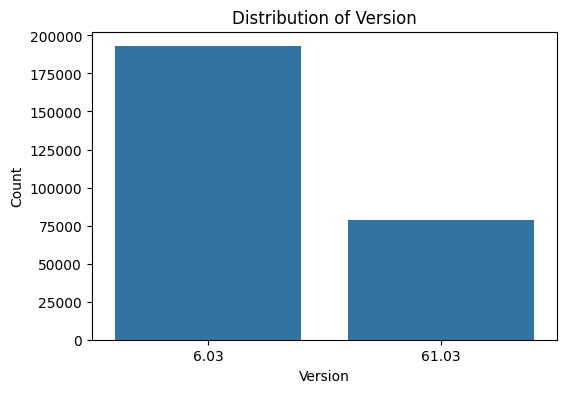

In [31]:
# Count plot for 'version'
plt.figure(figsize=(6, 4))
sns.countplot(x='version', data=df)
plt.title('Distribution of Version')
plt.xlabel('Version')
plt.ylabel('Count')
plt.show()

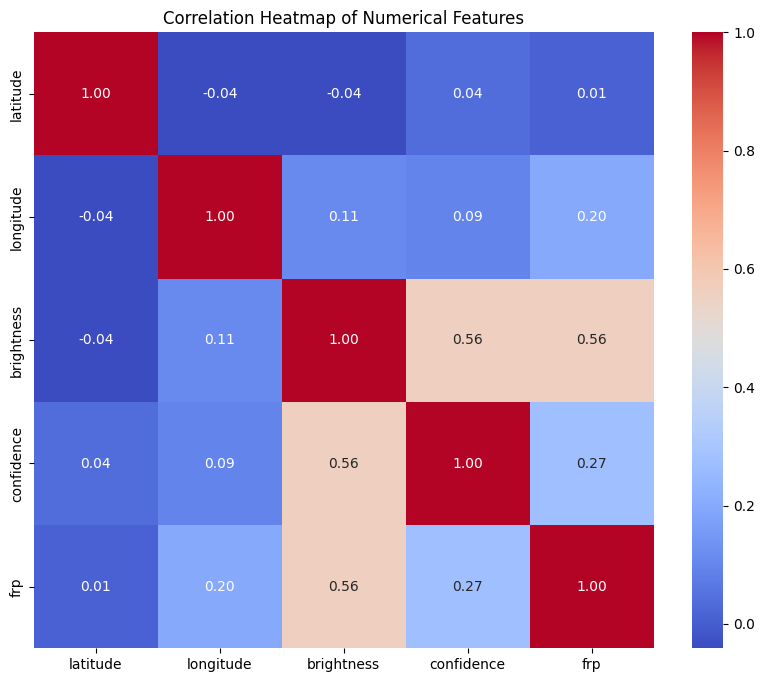

In [32]:
# Heatmap of correlations between numerical features
plt.figure(figsize=(10, 8))
correlation_matrix = df[['latitude', 'longitude', 'brightness', 'confidence', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [33]:
numerical_cols = df.select_dtypes(include=np.number).columns
numerical_cols

Index(['latitude', 'longitude', 'brightness', 'scan', 'track', 'acq_time',
       'confidence', 'version', 'bright_t31', 'frp', 'type'],
      dtype='object')

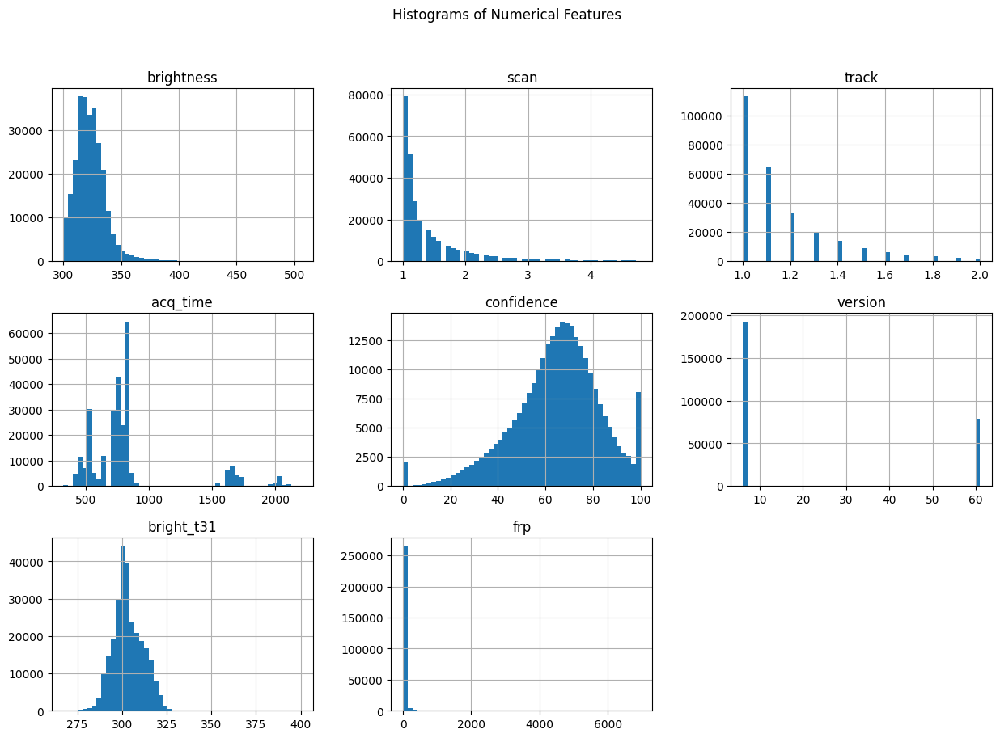

In [34]:
numerical_cols = ['brightness', 'scan', 'track', 'acq_time','confidence', 'version', 'bright_t31', 'frp']
df[numerical_cols].hist(bins=50, figsize=(15, 10))
plt.suptitle('Histograms of Numerical Features')
plt.show()

In [35]:
!pip install statsmodels


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


Analyzing distribution for: brightness


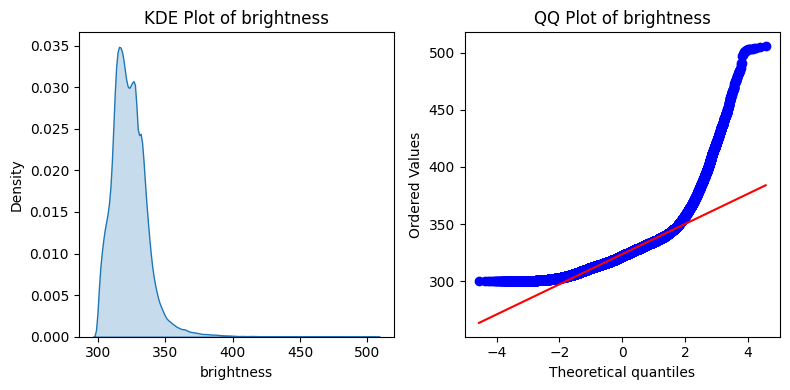

--------------------------------------------------
Analyzing distribution for: confidence


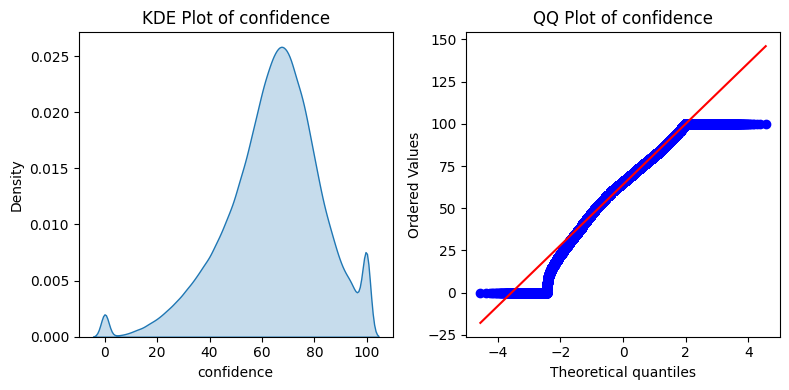

--------------------------------------------------
Analyzing distribution for: frp


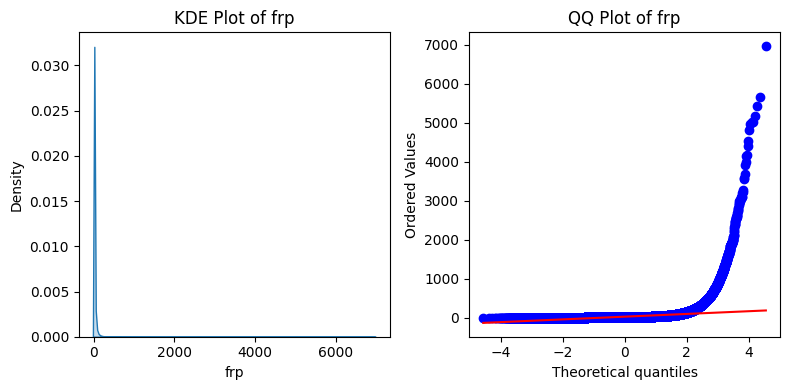

--------------------------------------------------
Analyzing distribution for: bright_t31


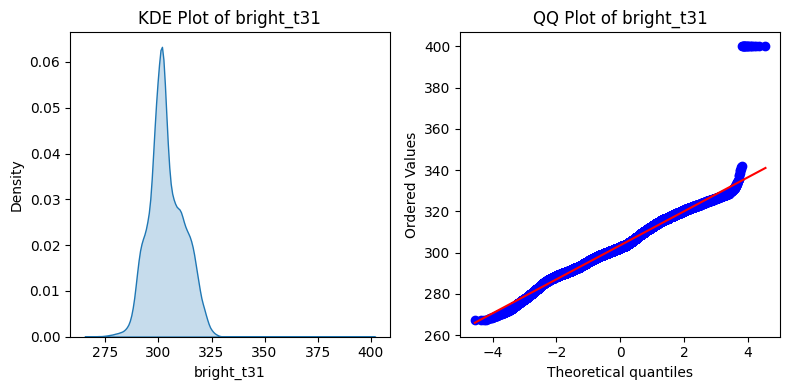

--------------------------------------------------
Analyzing distribution for: scan


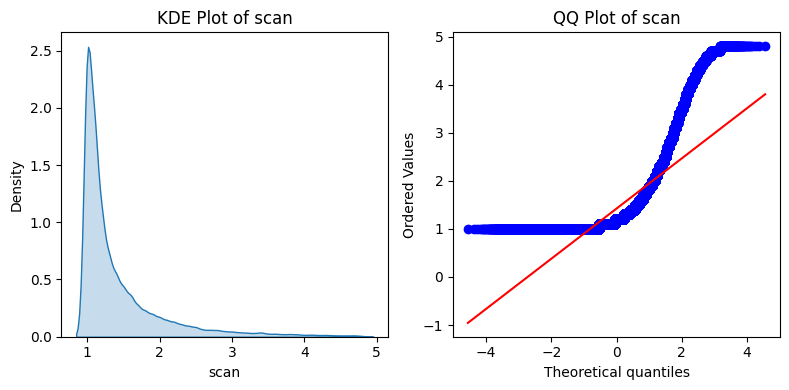

--------------------------------------------------
Analyzing distribution for: track


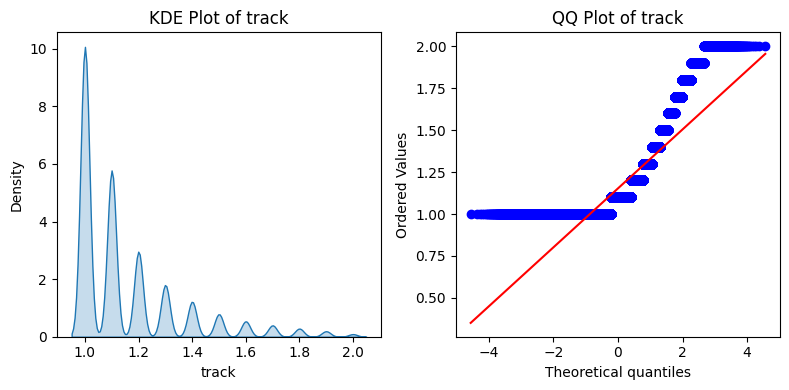

--------------------------------------------------


In [36]:
import statsmodels.api as sm
import scipy.stats as stats

# List of numerical features to check for distribution
numerical_features = ['brightness', 'confidence', 'frp', 'bright_t31', 'scan', 'track']

for feature in numerical_features:
    print(f"Analyzing distribution for: {feature}")

    # KDE Plot
    plt.figure(figsize=(8, 4))

    plt.subplot(1, 2, 1)
    sns.kdeplot(df[feature], fill=True)
    plt.title(f'KDE Plot of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

    # QQ Plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot of {feature}')

    plt.tight_layout()
    plt.show()
    print("-" * 50)

In [37]:
# --- Temporal Analysis ---

# Convert 'acq_date' to datetime objects
df['acq_date'] = pd.to_datetime(df['acq_date'], errors='coerce')  # errors='coerce' handles invalid dates

# Drop rows with invalid or missing acquisition date or time
df = df[df['acq_date'].notnull() & df['acq_time'].notnull()]

# Ensure 'acq_time' is a 4-digit string (HHMM format)
df['acq_time'] = df['acq_time'].astype(int).astype(str).str.zfill(4)

# Extract hour component from 'acq_time'
df['hour'] = df['acq_time'].str[:2].astype(int)

# Extract temporal features from 'acq_date'
df['year'] = df['acq_date'].dt.year
df['month'] = df['acq_date'].dt.month
df['day_of_week'] = df['acq_date'].dt.dayofweek  # Monday=0, Sunday=6
df['day_of_year'] = df['acq_date'].dt.dayofyear


C:\Users\Nilanjan\AppData\Local\Temp\ipykernel_22796\3766763484.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='month', palette='viridis')


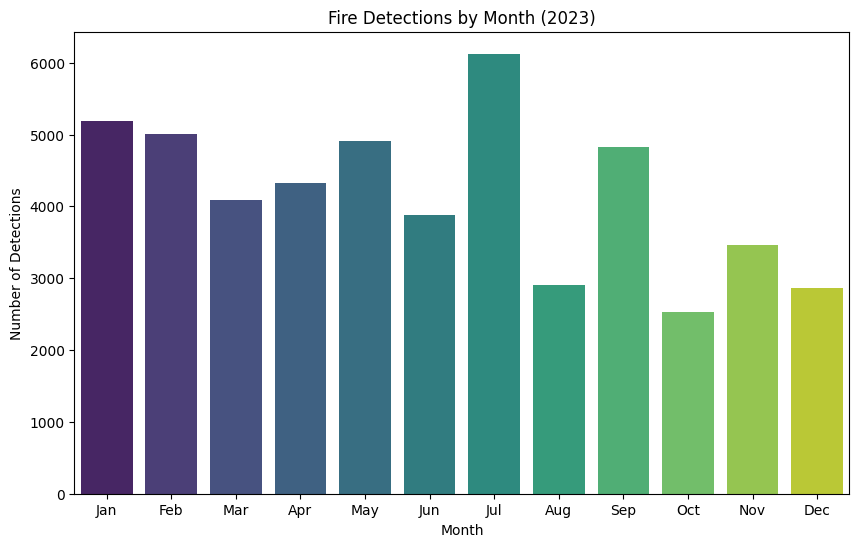

In [38]:
# Visualize fire detections over months
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='month', palette='viridis')
plt.title('Fire Detections by Month (2023)')
plt.xlabel('Month')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

C:\Users\Nilanjan\AppData\Local\Temp\ipykernel_22796\714612371.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='day_of_week', palette='viridis')


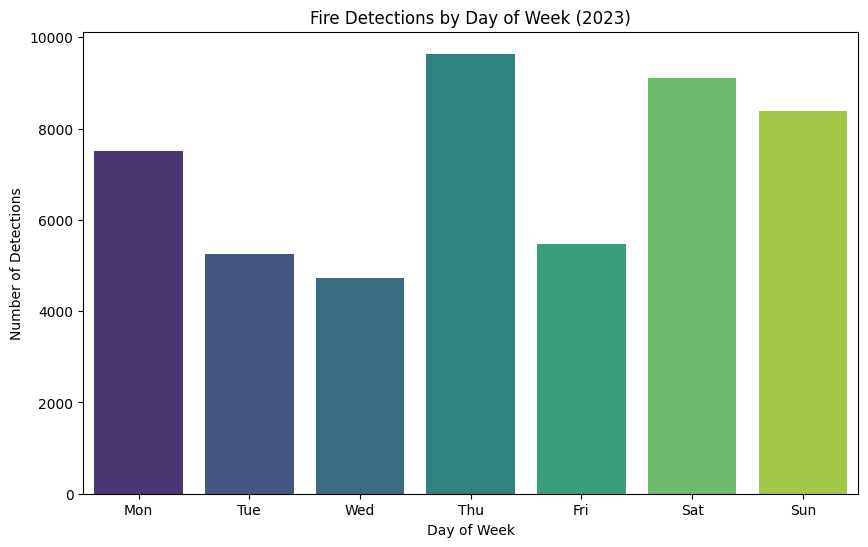

In [39]:
# Visualize fire detections by day of the week
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='day_of_week', palette='viridis')
plt.title('Fire Detections by Day of Week (2023)')
plt.xlabel('Day of Week')
plt.ylabel('Number of Detections')
plt.xticks(ticks=range(7), labels=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])
plt.show()

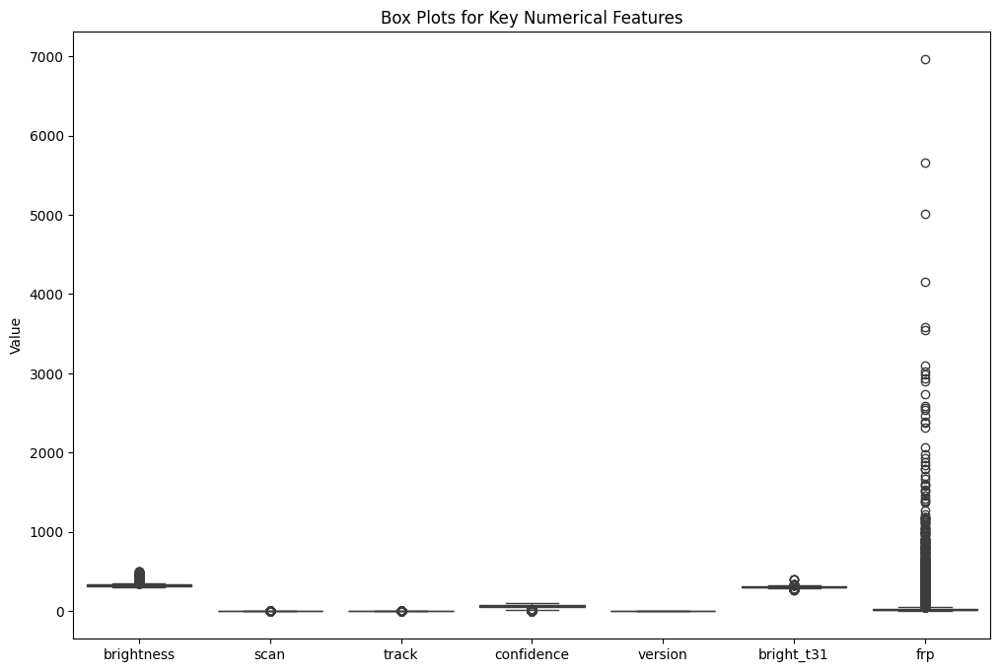

In [40]:
# Visualize outliers using box plots for key numerical features


plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Key Numerical Features')
plt.ylabel('Value')
plt.show()

In [41]:
def remove_outliers_iqr(df, column):
    # Ensure column is numeric
    df[column] = pd.to_numeric(df[column], errors='coerce')
    
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)].copy()

# Create a working copy of the dataframe
df_cleaned = df.copy()

# Apply IQR filtering safely
for col in numerical_cols:
    try:
        df_cleaned = remove_outliers_iqr(df_cleaned, col)
    except Exception as e:
        print(f"Skipped column '{col}' due to error: {e}")

print("Shape after removing outliers:", df_cleaned.shape)


Shape after removing outliers: (36028, 20)


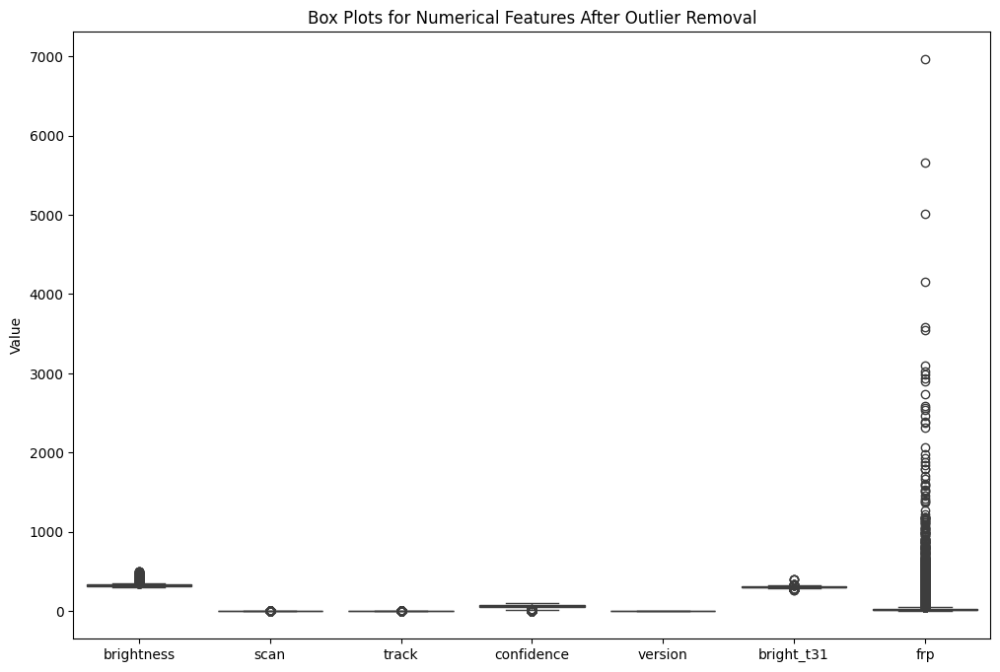

In [42]:
# Visualize box plots after outlier removal
plt.figure(figsize=(12, 8))
sns.boxplot(data=df[numerical_cols])
plt.title('Box Plots for Numerical Features After Outlier Removal')
plt.ylabel('Value')
plt.show()

In [43]:
df.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,satellite,instrument,confidence,version,bright_t31,frp,daynight,type,hour,year,month,day_of_week,day_of_year
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,0409,Terra,MODIS,44,6.03,292.6,8.6,D,0,4,2021,1,4,1
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,0547,Terra,MODIS,37,6.03,287.4,9.0,D,0,5,2021,1,4,1
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,0547,Terra,MODIS,8,6.03,286.5,5.4,D,0,5,2021,1,4,1
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,0547,Terra,MODIS,46,6.03,287.7,10.7,D,0,5,2021,1,4,1
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,0547,Terra,MODIS,43,6.03,287.6,9.0,D,0,5,2021,1,4,1


In [44]:
df.type.value_counts()

type
0    48283
2     1836
3        5
Name: count, dtype: int64

In [45]:
categorical_cols = df.select_dtypes(include='object').columns

In [46]:
categorical_cols

Index(['acq_time', 'satellite', 'instrument', 'daynight'], dtype='object')

In [47]:
# Select categorical columns for encoding
categorical_cols_to_encode = ['daynight', 'satellite', 'instrument']

# Apply One-Hot Encoding
df_encoded = pd.get_dummies(df, columns=categorical_cols_to_encode, drop_first=True)

In [48]:
df_encoded.head(100)

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,hour,year,month,day_of_week,day_of_year,daynight_N,satellite_Terra
0,28.0993,96.9983,303.0,1.1,1.1,2021-01-01,0409,44,6.03,292.6,8.6,0,4,2021,1,4,1,False,True
1,30.0420,79.6492,301.8,1.4,1.2,2021-01-01,0547,37,6.03,287.4,9.0,0,5,2021,1,4,1,False,True
2,30.0879,78.8579,300.2,1.3,1.1,2021-01-01,0547,8,6.03,286.5,5.4,0,5,2021,1,4,1,False,True
3,30.0408,80.0501,302.0,1.5,1.2,2021-01-01,0547,46,6.03,287.7,10.7,0,5,2021,1,4,1,False,True
4,30.6565,78.9668,300.9,1.3,1.1,2021-01-01,0547,43,6.03,287.6,9.0,0,5,2021,1,4,1,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,31.4713,77.7909,300.2,1.2,1.1,2021-01-01,1647,21,6.03,275.6,10.6,0,16,2021,1,4,1,True,True
96,27.2206,92.4247,312.3,1.4,1.2,2021-02-01,0452,64,6.03,289.8,18.4,0,4,2021,2,0,32,False,True
97,27.2410,92.4742,300.1,1.4,1.2,2021-02-01,0452,18,6.03,287.8,7.4,0,4,2021,2,0,32,False,True
98,27.2133,92.4663,302.6,1.4,1.2,2021-02-01,0452,46,6.03,289.6,9.2,0,4,2021,2,0,32,False,True


In [49]:
df_encoded.type.value_counts()

type
0    48283
2     1836
3        5
Name: count, dtype: int64

In [50]:
# Install folium if not already installed
!pip install folium


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [51]:


import folium
import pandas as pd

# Ensure 'acq_date' is datetime BEFORE sampling
df_encoded['acq_date'] = pd.to_datetime(df_encoded['acq_date'], errors='coerce')

# Sample the data safely
sample_df = df_encoded.sample(n=min(10000, len(df_encoded)), random_state=42)

# Create the base map
india_map = folium.Map(location=[22.351115, 78.667743], zoom_start=5)

# Add markers to the map
for _, row in sample_df.iterrows():
    # Check for valid data
    if pd.notnull(row['latitude']) and pd.notnull(row['longitude']) and pd.notnull(row['frp']):
        # Ensure acq_date is a datetime object before using strftime
        if isinstance(row['acq_date'], pd.Timestamp):
            popup_date = row['acq_date'].strftime('%Y-%m-%d')
        else:
            popup_date = 'Unknown'

        # Add marker
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=3,
            color='red',
            fill=True,
            fill_opacity=0.6,
            popup=f"FRP: {row['frp']:.2f}, Date: {popup_date}"
        ).add_to(india_map)

# Display the map
display(india_map)


In [52]:
scaler = StandardScaler()
numerical_cols_to_scale = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
df_encoded[numerical_cols_to_scale] = scaler.fit_transform(df_encoded[numerical_cols_to_scale])
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,hour,year,month,day_of_week,day_of_year,daynight_N,satellite_Terra
0,28.0993,96.9983,-1.560732,-0.512595,-0.261082,2021-01-01,0409,-1.063559,6.03,-1.420399,-0.207587,0,4,2021,1,4,1,False,True
1,30.0420,79.6492,-1.647652,-0.034200,0.235615,2021-01-01,0547,-1.443340,6.03,-2.049110,-0.203350,0,5,2021,1,4,1,False,True
2,30.0879,78.8579,-1.763545,-0.193665,-0.261082,2021-01-01,0547,-3.016721,6.03,-2.157925,-0.241483,0,5,2021,1,4,1,False,True
3,30.0408,80.0501,-1.633165,0.125265,0.235615,2021-01-01,0547,-0.955050,6.03,-2.012838,-0.185343,0,5,2021,1,4,1,False,True
4,30.6565,78.9668,-1.712842,-0.193665,-0.261082,2021-01-01,0547,-1.117813,6.03,-2.024929,-0.203350,0,5,2021,1,4,1,False,True


In [53]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50124 entries, 0 to 108763
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   latitude         50124 non-null  float64       
 1   longitude        50124 non-null  float64       
 2   brightness       50124 non-null  float64       
 3   scan             50124 non-null  float64       
 4   track            50124 non-null  float64       
 5   acq_date         50124 non-null  datetime64[ns]
 6   acq_time         50124 non-null  object        
 7   confidence       50124 non-null  float64       
 8   version          50124 non-null  float64       
 9   bright_t31       50124 non-null  float64       
 10  frp              50124 non-null  float64       
 11  type             50124 non-null  int64         
 12  hour             50124 non-null  int32         
 13  year             50124 non-null  int32         
 14  month            50124 non-null  int32    

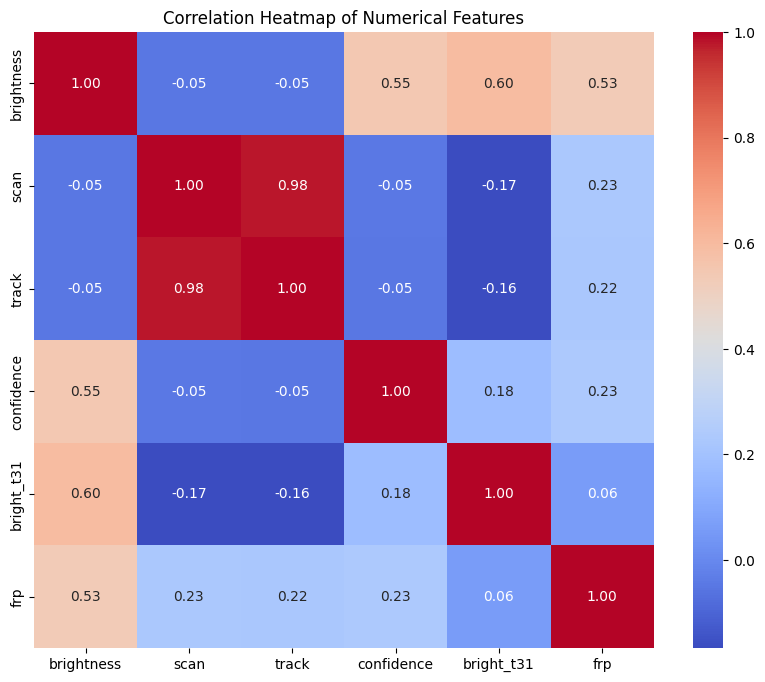

In [54]:
# Heatmap of correlations between numerical features
plt.figure(figsize=(10, 8))
correlation_matrix = df_encoded[['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

In [55]:
df_encoded.head()

,latitude,longitude,brightness,scan,track,acq_date,acq_time,confidence,version,bright_t31,frp,type,hour,year,month,day_of_week,day_of_year,daynight_N,satellite_Terra
0,28.0993,96.9983,-1.560732,-0.512595,-0.261082,2021-01-01,0409,-1.063559,6.03,-1.420399,-0.207587,0,4,2021,1,4,1,False,True
1,30.0420,79.6492,-1.647652,-0.034200,0.235615,2021-01-01,0547,-1.443340,6.03,-2.049110,-0.203350,0,5,2021,1,4,1,False,True
2,30.0879,78.8579,-1.763545,-0.193665,-0.261082,2021-01-01,0547,-3.016721,6.03,-2.157925,-0.241483,0,5,2021,1,4,1,False,True
3,30.0408,80.0501,-1.633165,0.125265,0.235615,2021-01-01,0547,-0.955050,6.03,-2.012838,-0.185343,0,5,2021,1,4,1,False,True
4,30.6565,78.9668,-1.712842,-0.193665,-0.261082,2021-01-01,0547,-1.117813,6.03,-2.024929,-0.203350,0,5,2021,1,4,1,False,True


In [56]:
df_encoded.type.value_counts()

type
0    48283
2     1836
3        5
Name: count, dtype: int64

In [57]:
# Separate features (X) and target variable (y)
# Assuming 'type' is the target variable you want to predict
# Drop temporal features if not intended for prediction task that uses 'type' as target
features = ['brightness', 'scan', 'track', 'confidence', 'bright_t31', 'frp']
target = 'type'

X = df_encoded[features]
y = df_encoded[target]


In [58]:
X

,brightness,scan,track,confidence,bright_t31,frp
0,-1.560732,-0.512595,-0.261082,-1.063559,-1.420399,-0.207587
1,-1.647652,-0.034200,0.235615,-1.443340,-2.049110,-0.203350
2,-1.763545,-0.193665,-0.261082,-3.016721,-2.157925,-0.241483
3,-1.633165,0.125265,0.235615,-0.955050,-2.012838,-0.185343
4,-1.712842,-0.193665,-0.261082,-1.117813,-2.024929,-0.203350
...,...,...,...,...,...,...
108759,-1.727329,2.995636,2.719096,-1.660358,-1.928204,0.029685
108760,-1.575219,-0.672061,-0.757778,-0.629523,-1.577577,-0.227713
108761,-1.611435,-0.672061,-0.757778,-0.846541,-1.517124,-0.243602
108762,-1.691112,-0.512595,-0.261082,-3.070975,-1.722664,-0.240424


In [59]:
y

0         0
1         0
2         0
3         0
4         0
         ..
108759    0
108760    2
108761    2
108762    2
108763    2
Name: type, Length: 50124, dtype: int64

In [60]:
print(y.value_counts())


type
0    48283
2     1836
3        5
Name: count, dtype: int64


In [61]:
!pip install -U imbalanced-learn
from imblearn.over_sampling import SMOTE


[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [66]:
from imblearn.over_sampling import SMOTE

# Check target variable distribution
print("Before SMOTE:\n", y.value_counts())

# Find the majority class count
majority_class_size = y.value_counts().max()

# Create a custom sampling strategy to upsample all classes to majority size
sampling_strategy = {label: majority_class_size for label in y.unique()}

# Apply SMOTE with k_neighbors=1 for safe generation
smote = SMOTE(sampling_strategy=sampling_strategy, k_neighbors=1, random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Show new distribution
print("After SMOTE:\n", y_resampled.value_counts())


Before SMOTE:
 type
0    48283
2     1836
3        5
Name: count, dtype: int64
After SMOTE:
 type
0    48283
2    48283
3    48283
Name: count, dtype: int64


In [67]:
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.25, random_state=42, stratify=y_resampled)

In [68]:
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (108636, 6)
Shape of X_test: (36213, 6)
Shape of y_train: (108636,)
Shape of y_test: (36213,)


In [69]:
# Import Logistic Regression to Train from SKlearn
loreg = LogisticRegression(max_iter=200)
loreg.fit(X_train,y_train)
loreg_pred = loreg.predict(X_test)
score = accuracy_score(y_test,loreg_pred)
cr = classification_report(y_test,loreg_pred)

print("Logistic Regression")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Logistic Regression
Accuracy Score value: 0.6276
              precision    recall  f1-score   support

           0       0.75      0.59      0.66     12071
           2       0.55      0.54      0.54     12071
           3       0.61      0.75      0.67     12071

    accuracy                           0.63     36213
   macro avg       0.64      0.63      0.63     36213
weighted avg       0.64      0.63      0.63     36213



In [70]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc.fit(X_train,y_train)
dtc_pred = dtc.predict(X_test)
score = accuracy_score(y_test,dtc_pred)
cr = classification_report(y_test,dtc_pred)

print("Decision Tree")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Decision Tree
Accuracy Score value: 0.9679
              precision    recall  f1-score   support

           0       0.97      0.93      0.95     12071
           2       0.94      0.97      0.95     12071
           3       1.00      1.00      1.00     12071

    accuracy                           0.97     36213
   macro avg       0.97      0.97      0.97     36213
weighted avg       0.97      0.97      0.97     36213



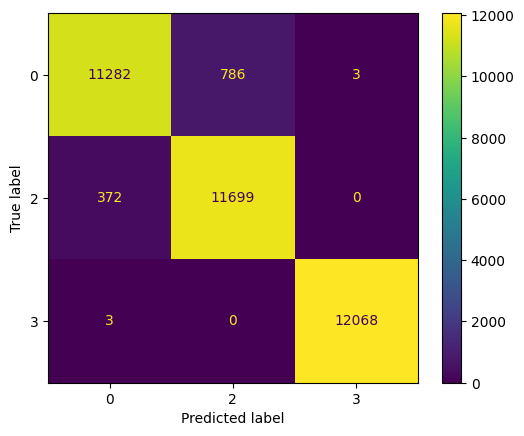

In [71]:
dt_cm = ConfusionMatrixDisplay.from_estimator(dtc, X_test, y_test)

In [72]:
rfc = RandomForestClassifier()
rfc.fit(X_train,y_train)
rfc_pred = rfc.predict(X_test)
score = accuracy_score(y_test,rfc_pred)
cr = classification_report(y_test,rfc_pred)

print("Random Forest")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

Random Forest
Accuracy Score value: 0.9863
              precision    recall  f1-score   support

           0       0.98      0.98      0.98     12071
           2       0.98      0.98      0.98     12071
           3       1.00      1.00      1.00     12071

    accuracy                           0.99     36213
   macro avg       0.99      0.99      0.99     36213
weighted avg       0.99      0.99      0.99     36213



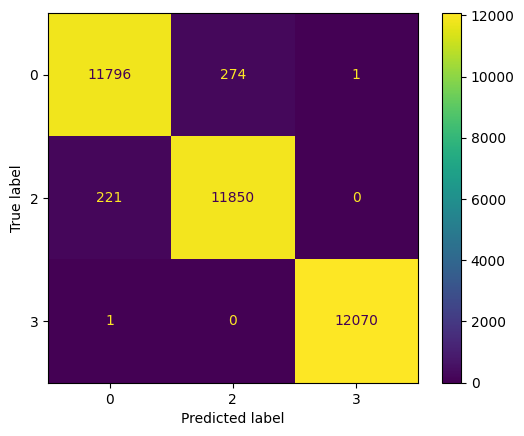

In [73]:
rf_cm = ConfusionMatrixDisplay.from_estimator(rfc, X_test, y_test)

In [74]:
# KNeighborsClassifier to Train from SKlearn
knnc = KNeighborsClassifier()
knnc.fit(X_train,y_train)
knn_pred = knnc.predict(X_test)
score = accuracy_score(y_test,knn_pred)
cr = classification_report(y_test,knn_pred)

print("KNeighbors Classifier")
print ("Accuracy Score value: {:.4f}".format(score))
print (cr)

KNeighbors Classifier
Accuracy Score value: 0.9553
              precision    recall  f1-score   support

           0       1.00      0.87      0.93     12071
           2       0.88      1.00      0.94     12071
           3       1.00      1.00      1.00     12071

    accuracy                           0.96     36213
   macro avg       0.96      0.96      0.96     36213
weighted avg       0.96      0.96      0.96     36213



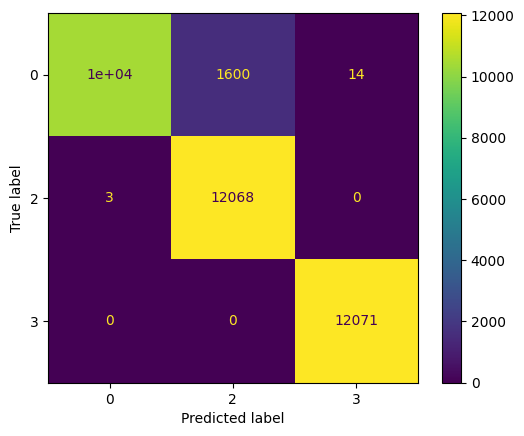

In [75]:
knn_cm = ConfusionMatrixDisplay.from_estimator(knnc, X_test, y_test)

In [76]:
# Collect the accuracies of each model
model_accuracies = {
    "Logistic Regression": accuracy_score(y_test, loreg_pred),
    "Decision Tree": accuracy_score(y_test, dtc_pred),
    "Random Forest": accuracy_score(y_test, rfc_pred),
    "KNeighbors Classifier": accuracy_score(y_test, knn_pred)
}

# Find the best model
best_model_name = max(model_accuracies, key=model_accuracies.get)
best_model_accuracy = model_accuracies[best_model_name]

print("Model Accuracies:")
for model, accuracy in model_accuracies.items():
    print(f"{model}: {accuracy:.4f}")

print(f"\nBest Model: {best_model_name} with Accuracy: {best_model_accuracy:.4f}")

Model Accuracies:
Logistic Regression: 0.6276
Decision Tree: 0.9679
Random Forest: 0.9863
KNeighbors Classifier: 0.9553

Best Model: Random Forest with Accuracy: 0.9863


In [78]:
import joblib

# Save the best model
# Based on the previous output, Random Forest was the best model.
best_model = rfc

joblib.dump(best_model, 'best_fire_detection_model.pkl')

# Save the StandardScaler instance
joblib.dump(scaler, 'scaler.pkl')

print("Best model and scaler saved successfully.")

Best model and scaler saved successfully.
